In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import requests
from bs4 import BeautifulSoup
from PIL import Image
from PIL import ImageOps
from colormap import rgb2hex
import cv2
from scipy import cluster
from sklearn.preprocessing import MinMaxScaler
import imagesize
import random
from sklearn.preprocessing import LabelEncoder
from ipywidgets import interact
import time
from io import BytesIO
# from fastai.vision.all import ImageDataLoaders
# from keras.applications.vgg16 import VGG16

In [125]:
from keras.layers import Dense, Flatten

In [2]:
pd.set_option('display.max_columns', None)


# Load raw data

In [3]:
PATH = 'Data/attribute-data/img/'

In [4]:
cat_names = pd.read_csv('Data/attribute-data/list_category.txt',sep ='\s+',header=None).reset_index().rename(columns={0:'category',1:'section','index':'cat_num'})



In [5]:
cat_names['cat_num'] = cat_names['cat_num'].apply(lambda x : x+1)

In [6]:
cat_names.head()

,cat_num,category,section
0,1,Anorak,1
1,2,Blazer,1
2,3,Blouse,1
3,4,Bomber,1
4,5,Button-Down,1


In [7]:
cat_tag = pd.read_csv('Data/attribute-data/tag_cat_simple.txt',sep='\s+',header=None,names=['category']).rename(columns={'category':'cat_num'})



In [8]:
cat_img = pd.read_csv('Data/attribute-data/img_simple.txt',sep='\s+',header=None,names=['category']).rename(columns={'category':'img'})

In [9]:
cat_num = cat_img.join(cat_tag).drop(columns='img')


In [10]:
cat_num.head()

,cat_num
0,3
1,33
2,41
3,26
4,2


In [11]:
cat = cat_num.merge(cat_names, on='cat_num', how='left').drop(columns='cat_num')



In [12]:
cat

,category,section
0,Blouse,1
1,Skirt,2
2,Dress,3
3,Jeans,2
4,Blazer,1
...,...,...
19995,Tank,1
19996,Sweater,1
19997,Henley,1
19998,Jumpsuit,3


In [13]:
cat['section'] = cat['section'].map({1:'upper',2:'lower',3:'full body'})

In [14]:
cat_names = pd.read_csv('Data/attribute-data/list_category.txt',sep ='\s+',header=None).reset_index().rename(columns={0:'category',1:'section','index':'cat_num'})



In [15]:
cat_names['cat_num'] = cat_names['cat_num'].apply(lambda x : x+1)

In [16]:
cat_names.head()

,cat_num,category,section
0,1,Anorak,1
1,2,Blazer,1
2,3,Blouse,1
3,4,Bomber,1
4,5,Button-Down,1


In [17]:
cat_tag = pd.read_csv('Data/attribute-data/tag_cat_simple.txt',sep='\s+',header=None,names=['category']).rename(columns={'category':'cat_num'})



In [18]:
cat_img = pd.read_csv('Data/attribute-data/img_simple.txt',sep='\s+',header=None,names=['category']).rename(columns={'category':'img'})

In [19]:
cat_num = cat_img.join(cat_tag)


In [20]:
cat_num.head()

,img,cat_num
0,img/Sweet_Crochet_Blouse/img_00000070.jpg,3
1,img/Classic_Pencil_Skirt/img_00000010.jpg,33
2,img/Strapless_Diamond_Print_Dress/img_00000038...,41
3,img/Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_0000...,26
4,img/Zippered_Single-Button_Blazer/img_00000078...,2


In [21]:
cat = cat_num.merge(cat_names, on='cat_num', how='left').drop(columns='cat_num')


In [22]:
cat['img'] = cat['img'].apply(lambda x: x[4:])

In [23]:
cat

,img,category,section
0,Sweet_Crochet_Blouse/img_00000070.jpg,Blouse,1
1,Classic_Pencil_Skirt/img_00000010.jpg,Skirt,2
2,Strapless_Diamond_Print_Dress/img_00000038.jpg,Dress,3
3,Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_00000010...,Jeans,2
4,Zippered_Single-Button_Blazer/img_00000078.jpg,Blazer,1
...,...,...,...
19995,Embroidered_Peasant_Tank/img_00000044.jpg,Tank,1
19996,Tasmanian_Devil_Sweater/img_00000048.jpg,Sweater,1
19997,Lace-Sleeved_Raglan_Henley/img_00000022.jpg,Henley,1
19998,Floral_Mosaic_Print_Jumpsuit/img_00000017.jpg,Jumpsuit,3


In [24]:
cat['section'] = cat['section'].map({1:'upper',2:'lower',3:'full body'})

In [25]:
attr_names = pd.read_csv('Data/attribute-data/list_attr_simple.txt',sep='\s+', header=None).rename(columns={0:'attribute',1:'attribute type'})


In [26]:
attr_names

,attribute,attribute type
0,floral,1
1,graphic,1
2,striped,1
3,embroidered,1
4,pleated,1
5,solid,1
6,lattice,1
7,long_sleeve,2
8,short_sleeve,2
9,sleeveless,2


In [27]:
attr_names['attribute type'] = attr_names['attribute type'].map({1:'design',2:'sleeves',3:'length',4:'part',5:'fabric',6:'fit'})


In [28]:
attr_names_headers = attr_names.iloc[:,0]
attr_names_headers

0              floral
1             graphic
2             striped
3         embroidered
4             pleated
5               solid
6             lattice
7         long_sleeve
8        short_sleeve
9          sleeveless
10        maxi_length
11        mini_length
12           no_dress
13      crew_neckline
14         v_neckline
15    square_neckline
16        no_neckline
17              denim
18            chiffon
19             cotton
20            leather
21               faux
22               knit
23              tight
24              loose
25       conventional
Name: attribute, dtype: object

In [29]:
attr_tags = pd.read_csv('Data/attribute-data/tags_attr_simple.txt',sep='\s+',header=None,names=attr_names_headers)


In [30]:
attr_tags

,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,no_dress,crew_neckline,v_neckline,square_neckline,no_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional
0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1
1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0
2,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1
3,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0
4,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1
19996,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1
19997,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1
19998,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1


In [31]:
attr_img = pd.read_csv('Data/attribute-data/img_simple.txt',sep='\s+',header=None).rename(columns={0:'img'})



In [32]:
attr_img

,img
0,img/Sweet_Crochet_Blouse/img_00000070.jpg
1,img/Classic_Pencil_Skirt/img_00000010.jpg
2,img/Strapless_Diamond_Print_Dress/img_00000038...
3,img/Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_0000...
4,img/Zippered_Single-Button_Blazer/img_00000078...
...,...
19995,img/Embroidered_Peasant_Tank/img_00000044.jpg
19996,img/Tasmanian_Devil_Sweater/img_00000048.jpg
19997,img/Lace-Sleeved_Raglan_Henley/img_00000022.jpg
19998,img/Floral_Mosaic_Print_Jumpsuit/img_00000017.jpg


In [33]:
attr = attr_img.join(attr_tags,how='inner').drop(columns='img')

In [34]:
attr

,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,no_dress,crew_neckline,v_neckline,square_neckline,no_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional
0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1
1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0
2,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1
3,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0
4,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1
19996,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1
19997,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1
19998,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1


In [35]:
bb = pd.read_csv('Data/attribute-data/bbox.txt',sep='\s+',header=None,index_col=False, names=['img','x_1', 'y_1', 'x_2', 'y_2'])


In [36]:
bb['img'] = bb['img'].apply(lambda x: x[4:])

In [37]:
landmarks = pd.read_csv('Data/attribute-data/landmarks.txt',sep='\s+',names=['img','clothes_type','v1','x1','y1','v2','x2','y2','v3','x3','y3','v4','x4','y4','v5','x5','y5','v6','x6','y6','v7','x7','y7','v8','x8','y8']).fillna(0).drop(columns=['clothes_type'])



In [38]:
landmarks['img'] = landmarks['img'].apply(lambda x: x[4:])

In [39]:
data_full = cat.join(attr,how='left').merge(bb,how='left',on='img').merge(landmarks, how='left',on='img')



# Filter attributes

In [40]:
data_full

,img,category,section,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,no_dress,crew_neckline,v_neckline,square_neckline,no_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional,x_1,y_1,x_2,y_2,v1,x1,y1,v2,x2,y2,v3,x3,y3,v4,x4,y4,v5,x5,y5,v6,x6,y6,v7,x7,y7,v8,x8,y8
0,Sweet_Crochet_Blouse/img_00000070.jpg,Blouse,upper,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,66,75,241,293,0,120,104,0,181,109,0,104,93,0,196,95,0.0,90.0,273.0,0.0,212.0,267.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Classic_Pencil_Skirt/img_00000010.jpg,Skirt,lower,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,65,88,132,218,1,75,103,1,121,99,0,74,206,0,118,206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Strapless_Diamond_Print_Dress/img_00000038.jpg,Dress,full body,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,75,43,176,300,0,104,64,0,132,64,0,98,71,0,140,68,0.0,100.0,99.0,0.0,138.0,102.0,0.0,89.0,276.0,0.0,159.0,277.0
3,Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_00000010...,Jeans,lower,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,64,1,129,273,1,73,13,0,116,5,0,89,237,0,118,246,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Zippered_Single-Button_Blazer/img_00000078.jpg,Blazer,upper,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,1,12,257,300,0,105,37,0,149,36,0,30,280,0,224,280,0.0,74.0,281.0,0.0,186.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,Embroidered_Peasant_Tank/img_00000044.jpg,Tank,upper,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,93,53,160,136,0,112,62,0,140,62,0,102,60,0,147,67,0.0,102.0,128.0,0.0,149.0,123.0,0.0,0.0,0.0,0.0,0.0,0.0
19996,Tasmanian_Devil_Sweater/img_00000048.jpg,Sweater,upper,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,38,74,196,261,0,80,99,0,136,89,0,60,239,0,170,244,0.0,83.0,232.0,0.0,140.0,228.0,0.0,0.0,0.0,0.0,0.0,0.0
19997,Lace-Sleeved_Raglan_Henley/img_00000022.jpg,Henley,upper,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,99,51,136,172,0,111,61,1,130,62,0,111,144,0,129,153,0.0,104.0,156.0,1.0,124.0,161.0,0.0,0.0,0.0,0.0,0.0,0.0
19998,Floral_Mosaic_Print_Jumpsuit/img_00000017.jpg,Jumpsuit,full body,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,57,36,158,268,0,91,56,1,123,55,0,71,83,0,141,84,0.0,88.0,105.0,0.0,124.0,106.0,0.0,96.0,247.0,0.0,114.0,244.0


In [41]:
# If item is sleevless and of lower type, set attribute value to 0:
data_full['sleeveless'] = data_full.apply(lambda x: 0 if ((x['sleeveless'])==1) & (x['section']=='lower') else x['sleeveless'], axis =1)


In [42]:
data_full

,img,category,section,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,no_dress,crew_neckline,v_neckline,square_neckline,no_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional,x_1,y_1,x_2,y_2,v1,x1,y1,v2,x2,y2,v3,x3,y3,v4,x4,y4,v5,x5,y5,v6,x6,y6,v7,x7,y7,v8,x8,y8
0,Sweet_Crochet_Blouse/img_00000070.jpg,Blouse,upper,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,66,75,241,293,0,120,104,0,181,109,0,104,93,0,196,95,0.0,90.0,273.0,0.0,212.0,267.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Classic_Pencil_Skirt/img_00000010.jpg,Skirt,lower,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,65,88,132,218,1,75,103,1,121,99,0,74,206,0,118,206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Strapless_Diamond_Print_Dress/img_00000038.jpg,Dress,full body,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,75,43,176,300,0,104,64,0,132,64,0,98,71,0,140,68,0.0,100.0,99.0,0.0,138.0,102.0,0.0,89.0,276.0,0.0,159.0,277.0
3,Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_00000010...,Jeans,lower,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,64,1,129,273,1,73,13,0,116,5,0,89,237,0,118,246,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Zippered_Single-Button_Blazer/img_00000078.jpg,Blazer,upper,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,1,12,257,300,0,105,37,0,149,36,0,30,280,0,224,280,0.0,74.0,281.0,0.0,186.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,Embroidered_Peasant_Tank/img_00000044.jpg,Tank,upper,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,93,53,160,136,0,112,62,0,140,62,0,102,60,0,147,67,0.0,102.0,128.0,0.0,149.0,123.0,0.0,0.0,0.0,0.0,0.0,0.0
19996,Tasmanian_Devil_Sweater/img_00000048.jpg,Sweater,upper,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,38,74,196,261,0,80,99,0,136,89,0,60,239,0,170,244,0.0,83.0,232.0,0.0,140.0,228.0,0.0,0.0,0.0,0.0,0.0,0.0
19997,Lace-Sleeved_Raglan_Henley/img_00000022.jpg,Henley,upper,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,99,51,136,172,0,111,61,1,130,62,0,111,144,0,129,153,0.0,104.0,156.0,1.0,124.0,161.0,0.0,0.0,0.0,0.0,0.0,0.0
19998,Floral_Mosaic_Print_Jumpsuit/img_00000017.jpg,Jumpsuit,full body,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,57,36,158,268,0,91,56,1,123,55,0,71,83,0,141,84,0.0,88.0,105.0,0.0,124.0,106.0,0.0,96.0,247.0,0.0,114.0,244.0


In [43]:
data_full.drop(columns=['no_dress','no_neckline'],inplace=True)

# Crop and augment images

In [44]:
data_full

,img,category,section,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,crew_neckline,v_neckline,square_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional,x_1,y_1,x_2,y_2,v1,x1,y1,v2,x2,y2,v3,x3,y3,v4,x4,y4,v5,x5,y5,v6,x6,y6,v7,x7,y7,v8,x8,y8
0,Sweet_Crochet_Blouse/img_00000070.jpg,Blouse,upper,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,66,75,241,293,0,120,104,0,181,109,0,104,93,0,196,95,0.0,90.0,273.0,0.0,212.0,267.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Classic_Pencil_Skirt/img_00000010.jpg,Skirt,lower,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,65,88,132,218,1,75,103,1,121,99,0,74,206,0,118,206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Strapless_Diamond_Print_Dress/img_00000038.jpg,Dress,full body,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,75,43,176,300,0,104,64,0,132,64,0,98,71,0,140,68,0.0,100.0,99.0,0.0,138.0,102.0,0.0,89.0,276.0,0.0,159.0,277.0
3,Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_00000010...,Jeans,lower,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,64,1,129,273,1,73,13,0,116,5,0,89,237,0,118,246,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Zippered_Single-Button_Blazer/img_00000078.jpg,Blazer,upper,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,12,257,300,0,105,37,0,149,36,0,30,280,0,224,280,0.0,74.0,281.0,0.0,186.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,Embroidered_Peasant_Tank/img_00000044.jpg,Tank,upper,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,93,53,160,136,0,112,62,0,140,62,0,102,60,0,147,67,0.0,102.0,128.0,0.0,149.0,123.0,0.0,0.0,0.0,0.0,0.0,0.0
19996,Tasmanian_Devil_Sweater/img_00000048.jpg,Sweater,upper,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,38,74,196,261,0,80,99,0,136,89,0,60,239,0,170,244,0.0,83.0,232.0,0.0,140.0,228.0,0.0,0.0,0.0,0.0,0.0,0.0
19997,Lace-Sleeved_Raglan_Henley/img_00000022.jpg,Henley,upper,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,99,51,136,172,0,111,61,1,130,62,0,111,144,0,129,153,0.0,104.0,156.0,1.0,124.0,161.0,0.0,0.0,0.0,0.0,0.0,0.0
19998,Floral_Mosaic_Print_Jumpsuit/img_00000017.jpg,Jumpsuit,full body,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,57,36,158,268,0,91,56,1,123,55,0,71,83,0,141,84,0.0,88.0,105.0,0.0,124.0,106.0,0.0,96.0,247.0,0.0,114.0,244.0


In [45]:
data_full_attr = data_full.iloc[:,3:-28]

In [46]:
data_full_attr

,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,crew_neckline,v_neckline,square_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional
0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1
1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
2,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
4,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1
19996,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1
19997,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1
19998,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1


In [47]:
attribute_count = data_full_attr.apply(pd.value_counts)

In [48]:
attribute_count_T = attribute_count.T.reset_index().rename(columns={'index':'attribute'})

In [49]:
attribute_count_T

,attribute,0,1
0,floral,16598,3402
1,graphic,16654,3346
2,striped,18653,1347
3,embroidered,18333,1667
4,pleated,19586,414
5,solid,10518,9482
6,lattice,19658,342
7,long_sleeve,13883,6117
8,short_sleeve,16526,3474
9,sleeveless,13365,6635


In [50]:
attribute_count_type = attribute_count_T.merge(attr_names, on='attribute')

In [51]:
attribute_count_type

,attribute,0,1,attribute type
0,floral,16598,3402,design
1,graphic,16654,3346,design
2,striped,18653,1347,design
3,embroidered,18333,1667,design
4,pleated,19586,414,design
5,solid,10518,9482,design
6,lattice,19658,342,design
7,long_sleeve,13883,6117,sleeves
8,short_sleeve,16526,3474,sleeves
9,sleeveless,13365,6635,sleeves


In [52]:
attribute_count_type_mean = attribute_count_type.groupby('attribute type').median().drop(columns=0)

/tmp/ipykernel_30431/1488309440.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  attribute_count_type_mean = attribute_count_type.groupby('attribute type').median().drop(columns=0)


In [53]:
attribute_count_type_mean

,1
attribute type,
design,1667.0
fabric,1458.0
fit,2891.0
length,2931.5
part,3458.0
sleeves,6117.0


In [54]:
attribute_count_mean = attribute_count_type[1].median()
attribute_count_mean

2888.0

In [55]:
attr_names_list = attribute_count_type['attribute'].values
attr_names_list

array(['floral', 'graphic', 'striped', 'embroidered', 'pleated', 'solid',
       'lattice', 'long_sleeve', 'short_sleeve', 'sleeveless',
       'maxi_length', 'mini_length', 'crew_neckline', 'v_neckline',
       'square_neckline', 'denim', 'chiffon', 'cotton', 'leather', 'faux',
       'knit', 'tight', 'loose', 'conventional'], dtype=object)

In [56]:
def landmark_crop(index): # NOT USED AT THE MOMENT !
    observation = data_full.iloc[index,:] # get observation from database according to index
    v1,x1,y1,v2,x2,y2,v3,x3,y3,v4,x4,y4=observation[-24:-12] # landmarks belonging to ALL images
    lm_x = [x1,x2,x3,x4]
    lm_y = [y1,y2,y3,y4]
    lm_v = [v1,v2,v3,v4]
    
    section = data_full.iloc[index,2] # get section type for image
    if section == 'upper' or section == 'full body': # if image is an upper or full body, has 6 landmarks
        v5,x5,y5,v6,x6,y6=observation[-12:-6]
        lm_x.extend([x5,x6])
        lm_y.extend([y5,y6])
        lm_v.extend([v5,v6])
    if section == 'full body': # if image is full body has 8 landmarks
        v7,x7,y7,v8,x8,y8=observation[-6:]
        lm_x.extend([x7,x8])
        lm_y.extend([y7,y8])
        lm_v.extend([v7,v8])
    
    lm_x = np.array(lm_x)
    lm_y = np.array(lm_y)
    lm_x = lm_x[lm_x !=0] # keep only non-zero landmarks 
    lm_y = lm_y[lm_y !=0]
    
    pts = (np.array(list(zip(lm_x,lm_y)))).astype('int') # store coordinates defined by landmarks
    
    img_name = observation[0]
    full_path = PATH+img_name
    
    img = cv2.imread(full_path) # open image using OpenCV
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert image to correct format
    
    x,y,w,h = cv2.boundingRect(pts) # create approximate rectangle using landmark points
    cropped = Image.fromarray(img[y:y+h, x:x+w].copy()) # crop image by bounding rectangle

    return cropped
    

In [57]:
def format_image(index): # format image
    observation = data_full.iloc[index,:] # get observation from database according to index    
    img_name = observation[0]
    full_path = PATH+img_name
    
    img = cv2.imread(full_path) # open image using OpenCV
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # CROP IMAGES:
    plt.imshow(img)
    box_x1,box_y1,box_x2,box_y2 = (np.array(observation[-28:-24].values)) # box coords
    cropped = Image.fromarray(img[box_y1:box_y2, box_x1:box_x2].copy()) # crop image using box

    # PAD IMAGES:
    cropped_pad = ImageOps.pad(cropped,(256,256),color=(255, 255, 255)) # pad image to (256,256) with white background
    plt.imshow(cropped_pad)
    
    # AUGMENT IMAGES:
#     # Create an ImageDataGenerator object with the desired transformations
#     datagen = ImageDataGenerator(
#         rotation_range=40,
#         zoom_range=0.2,
#         horizontal_flip=True
#     )
#     # Load the original image
#     image = im_pad
#     # Convert the image to a Numpy array
#     x = img_to_array(image)
#     # Reshape the array to include an extra dimension for the number of images
#     x = x.reshape((1,) + x.shape)
#     # Generate the augmented images and save them
#     i = 0
#     for batch in datagen.flow(x, batch_size=1, save_to_dir=PATH, save_format='jpg'):
#         i += 1
#         if i >= 10:
#             break
    return cropped_pad


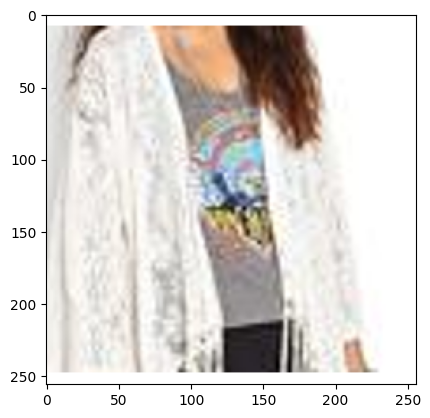

In [58]:
sample_index = np.random.randint(20000)
image = format_image(sample_index)

plt.imshow(image)

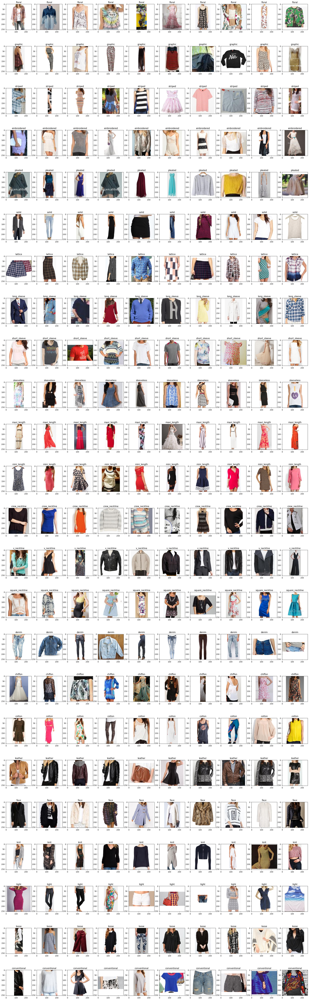

In [59]:
fig, axs = plt.subplots(24,10,figsize=(30,100))
for i in range(24):
    for j in range(10):
        index = data_full[data_full[attr_names_list[i]]==1].sample(1).index._data[0]
        img = format_image(index)
        img = axs[i][j].imshow(img)
        axs[i][j].title.set_text(attr_names_list[i])

In [60]:
def landmark_crop(index): # NOT USED AT THE MOMENT !
    observation = data_full.iloc[index,:] # get observation from database according to index
    v1,x1,y1,v2,x2,y2,v3,x3,y3,v4,x4,y4=observation[-24:-12] # landmarks belonging to ALL images
    lm_x = [x1,x2,x3,x4]
    lm_y = [y1,y2,y3,y4]
    lm_v = [v1,v2,v3,v4]
    
    section = data_full.iloc[index,2] # get section type for image
    if section == 'upper' or section == 'full body': # if image is an upper or full body, has 6 landmarks
        v5,x5,y5,v6,x6,y6=observation[-12:-6]
        lm_x.extend([x5,x6])
        lm_y.extend([y5,y6])
        lm_v.extend([v5,v6])
    if section == 'full body': # if image is full body has 8 landmarks
        v7,x7,y7,v8,x8,y8=observation[-6:]
        lm_x.extend([x7,x8])
        lm_y.extend([y7,y8])
        lm_v.extend([v7,v8])
    
    lm_x = np.array(lm_x)
    lm_y = np.array(lm_y)
    lm_x = lm_x[lm_x !=0] # keep only non-zero landmarks 
    lm_y = lm_y[lm_y !=0]
    
    pts = (np.array(list(zip(lm_x,lm_y)))).astype('int') # store coordinates defined by landmarks
    
    img_name = observation[0]
    full_path = PATH+img_name
    
    img = cv2.imread(full_path) # open image using OpenCV
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert image to correct format
    
    x,y,w,h = cv2.boundingRect(pts) # create approximate rectangle using landmark points
    cropped = Image.fromarray(img[y:y+h, x:x+w].copy()) # crop image by bounding rectangle

    return cropped
    

# Attribute model testing 

## Without image augmentation

### VGG16

In [61]:
design = data_full.iloc[:, np.r_[0,3:10]]

In [62]:
design

,img,floral,graphic,striped,embroidered,pleated,solid,lattice
0,Sweet_Crochet_Blouse/img_00000070.jpg,0,0,0,1,0,0,0
1,Classic_Pencil_Skirt/img_00000010.jpg,0,0,0,0,0,1,0
2,Strapless_Diamond_Print_Dress/img_00000038.jpg,0,1,0,0,0,0,0
3,Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_00000010...,0,0,0,0,0,1,0
4,Zippered_Single-Button_Blazer/img_00000078.jpg,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...
19995,Embroidered_Peasant_Tank/img_00000044.jpg,0,0,0,1,0,0,0
19996,Tasmanian_Devil_Sweater/img_00000048.jpg,0,0,0,0,0,1,0
19997,Lace-Sleeved_Raglan_Henley/img_00000022.jpg,0,0,1,0,0,0,0
19998,Floral_Mosaic_Print_Jumpsuit/img_00000017.jpg,1,0,0,0,0,0,0


In [63]:
from sklearn.model_selection import train_test_split

In [64]:
X_train, X_test, y_train, y_test = train_test_split(design[:1000]['img'], design.drop(columns='img')[:1000], test_size=0.3, random_state=2)

In [65]:
from keras import Model
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.models import load_model
from keras.optimizers import Adam
from keras.utils.vis_utils import plot_model
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout,BatchNormalization
from keras.layers import Conv2D, Concatenate, MaxPooling2D
from keras.layers import UpSampling2D, Dropout, BatchNormalization
from tqdm import tqdm_notebook
from keras import initializers
from keras import regularizers
from keras import constraints
from keras.utils import conv_utils
from keras.utils.data_utils import get_file
# from keras.engine.topology import get_source_inputs
?from keras import backend as K
from keras.regularizers import l2

from tensorflow.keras.layers import Layer, InputSpec
from keras.engine.training import Model
from keras.layers.convolutional import Conv2D, UpSampling2D, Conv2DTranspose
from keras.layers.core import Activation, SpatialDropout2D
from keras.layers import concatenate,add
from keras.layers import BatchNormalization
from keras.layers.pooling import MaxPooling2D
from keras.layers import Input,Dropout,BatchNormalization,Activation,Add
from keras.utils import load_img

2022-12-05 21:59:03.493276: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-05 21:59:04.077377: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/nigel/.pyenv/versions/3.10.6/envs/taxifare-env/lib/python3.10/site-packages/cv2/../../lib64:
2022-12-05 21:59:04.077432: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-05 21:59:04.130485: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for pl

Object `from keras import backend as K` not found.


In [66]:
# img_size_ori = 101
# img_size_target = 128

# def upsample(img):
#     if img_size_ori == img_size_target:
#         return img
#     return resize(img, (img_size_target, img_size_target), mode='constant', preserve_range=True)
#     #res = np.zeros((img_size_target, img_size_target), dtype=img.dtype)
#     #res[:img_size_ori, :img_size_ori] = img
#     #return res
    
# def downsample(img):
#     if img_size_ori == img_size_target:
#         return img
#     return resize(img, (img_size_ori, img_size_ori), mode='constant', preserve_range=True)
#     #return img[:img_size_ori, :img_size_ori]

In [81]:
X = np.array([load_img(f"Data/attribute-data/img/{endpoint}") for endpoint in X_train])


/tmp/ipykernel_30431/3074772977.py:1: FutureWarning: The input object of type 'JpegImageFile' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'JpegImageFile', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  X = np.array([load_img(f"Data/attribute-data/img/{endpoint}") for endpoint in X_train])
/tmp/ipykernel_30431/3074772977.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array([load_img(f"Data/attribute-data/img/{endpoint}") for endpoint in X_train])


In [68]:
from keras.applications import InceptionV3
from keras.applications import inception_v3

In [140]:
base_model = InceptionV3(include_top=False, weights='imagenet', classes=7, input_shape=(299, 299, 3))

In [98]:
from keras.utils import img_to_array

In [114]:
def format_image(img_name): #,box_x1,box_y1,box_x2,box_y2): # format image
    full_path = PATH+img_name
    
    # LOAD IMAGES:
    img = cv2.imread(full_path) # open image using OpenCV
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # What if we cut this
    
    # CROP IMAGES:
#     cropped = Image.fromarray(img[box_y1:box_y2, box_x1:box_x2].copy()) # crop image using box
    
    # TEMP INSTEAD OF CROPPING
    tmp = Image.fromarray(img.copy()) # crop image using box

                 
    # PAD IMAGES:
    cropped_pad = ImageOps.pad(tmp,(299,299),color=(255)) # pad image to (256,256) with white background
    
    cropped_pad_array = img_to_array(cropped_pad)/255
    
    return cropped_pad_array

In [115]:
X_ready = [format_image(img) for img in X_train]

In [116]:
def preprocess_input(x):
    x /= 255.
    x -= 0.5
    x *= 2.
    return x

In [117]:
X_superready = [inception_v3.preprocess_input(x) for x in X_ready]

In [118]:
X_superready[0].shape

(299, 299, 3)

In [129]:
from keras.callbacks import EarlyStopping


In [130]:
es = EarlyStopping(patience=5)

In [148]:
# add a new top layer
x = base_model.output
x = Flatten()(x)
predictions = Dense(7, activation='sigmoid')(x)

# this is the model we will train
model = InceptionV3(include_top=False, weights='imagenet', classes=7, input_shape=(299, 299, 3))

In [149]:
# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from keras.optimizers import SGD
model.compile(loss='binary_crossentropy', # We NEED binary here, since categorical_crossentropy l1 norms the output before calculating loss.
              optimizer='adam')

In [143]:
X_superready[0].shape

(299, 299, 3)

In [151]:
model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_282 (Conv2D)            (None, 149, 149, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_282 (Batch  (None, 149, 149, 32  96         ['conv2d_282[0][0]']             
 Normalization)                 )                                                      

 conv2d_293 (Conv2D)            (None, 35, 35, 32)   6144        ['average_pooling2d_27[0][0]']   
                                                                                                  
 batch_normalization_287 (Batch  (None, 35, 35, 64)  192         ['conv2d_287[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_289 (Batch  (None, 35, 35, 64)  192         ['conv2d_289[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_292 (Batch  (None, 35, 35, 96)  288         ['conv2d_292[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 conv2d_304 (Conv2D)            (None, 35, 35, 64)   18432       ['mixed1[0][0]']                 
                                                                                                  
 batch_normalization_304 (Batch  (None, 35, 35, 64)  192         ['conv2d_304[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_304 (Activation)    (None, 35, 35, 64)   0           ['batch_normalization_304[0][0]']
                                                                                                  
 conv2d_302 (Conv2D)            (None, 35, 35, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_30

                                                                                                  
 activation_311 (Activation)    (None, 17, 17, 96)   0           ['batch_normalization_311[0][0]']
                                                                                                  
 max_pooling2d_14 (MaxPooling2D  (None, 17, 17, 288)  0          ['mixed2[0][0]']                 
 )                                                                                                
                                                                                                  
 mixed3 (Concatenate)           (None, 17, 17, 768)  0           ['activation_308[0][0]',         
                                                                  'activation_311[0][0]',         
                                                                  'max_pooling2d_14[0][0]']       
                                                                                                  
 conv2d_31

 mixed4 (Concatenate)           (None, 17, 17, 768)  0           ['activation_312[0][0]',         
                                                                  'activation_315[0][0]',         
                                                                  'activation_320[0][0]',         
                                                                  'activation_321[0][0]']         
                                                                                                  
 conv2d_326 (Conv2D)            (None, 17, 17, 160)  122880      ['mixed4[0][0]']                 
                                                                                                  
 batch_normalization_326 (Batch  (None, 17, 17, 160)  480        ['conv2d_326[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activatio

 conv2d_336 (Conv2D)            (None, 17, 17, 160)  122880      ['mixed5[0][0]']                 
                                                                                                  
 batch_normalization_336 (Batch  (None, 17, 17, 160)  480        ['conv2d_336[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_336 (Activation)    (None, 17, 17, 160)  0           ['batch_normalization_336[0][0]']
                                                                                                  
 conv2d_337 (Conv2D)            (None, 17, 17, 160)  179200      ['activation_336[0][0]']         
                                                                                                  
 batch_normalization_337 (Batch  (None, 17, 17, 160)  480        ['conv2d_337[0][0]']             
 Normaliza

 activation_346 (Activation)    (None, 17, 17, 192)  0           ['batch_normalization_346[0][0]']
                                                                                                  
 conv2d_347 (Conv2D)            (None, 17, 17, 192)  258048      ['activation_346[0][0]']         
                                                                                                  
 batch_normalization_347 (Batch  (None, 17, 17, 192)  576        ['conv2d_347[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_347 (Activation)    (None, 17, 17, 192)  0           ['batch_normalization_347[0][0]']
                                                                                                  
 conv2d_343 (Conv2D)            (None, 17, 17, 192)  147456      ['mixed6[0][0]']                 
          

 Normalization)                                                                                   
                                                                                                  
 activation_355 (Activation)    (None, 17, 17, 192)  0           ['batch_normalization_355[0][0]']
                                                                                                  
 conv2d_352 (Conv2D)            (None, 17, 17, 192)  147456      ['mixed7[0][0]']                 
                                                                                                  
 conv2d_356 (Conv2D)            (None, 17, 17, 192)  258048      ['activation_355[0][0]']         
                                                                                                  
 batch_normalization_352 (Batch  (None, 17, 17, 192)  576        ['conv2d_352[0][0]']             
 Normalization)                                                                                   
          

 Normalization)                                                                                   
                                                                                                  
 conv2d_366 (Conv2D)            (None, 8, 8, 192)    245760      ['average_pooling2d_34[0][0]']   
                                                                                                  
 batch_normalization_358 (Batch  (None, 8, 8, 320)   960         ['conv2d_358[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_360 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_360[0][0]']
                                                                                                  
 activation_361 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_361[0][0]']
          

                                                                                                  
 activation_369 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_369[0][0]']
                                                                                                  
 activation_370 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_370[0][0]']
                                                                                                  
 activation_373 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_373[0][0]']
                                                                                                  
 activation_374 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_374[0][0]']
                                                                                                  
 batch_normalization_375 (Batch  (None, 8, 8, 192)   576         ['conv2d_375[0][0]']             
 Normaliza

In [150]:
# Fit the model (Add history so that the history may be saved)
history = model.fit(X_superready, y_train,
          batch_size=16,
          epochs=10,
          verbose=1,
          callbacks=[es],
          validation_split=0.2)

Epoch 1/10


ValueError: in user code:

    File "/home/nigel/.pyenv/versions/3.10.6/envs/taxifare-env/lib/python3.10/site-packages/keras/engine/training.py", line 1160, in train_function  *
        return step_function(self, iterator)
    File "/home/nigel/.pyenv/versions/3.10.6/envs/taxifare-env/lib/python3.10/site-packages/keras/engine/training.py", line 1146, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/nigel/.pyenv/versions/3.10.6/envs/taxifare-env/lib/python3.10/site-packages/keras/engine/training.py", line 1135, in run_step  **
        outputs = model.train_step(data)
    File "/home/nigel/.pyenv/versions/3.10.6/envs/taxifare-env/lib/python3.10/site-packages/keras/engine/training.py", line 993, in train_step
        y_pred = self(x, training=True)
    File "/home/nigel/.pyenv/versions/3.10.6/envs/taxifare-env/lib/python3.10/site-packages/keras/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/home/nigel/.pyenv/versions/3.10.6/envs/taxifare-env/lib/python3.10/site-packages/keras/engine/input_spec.py", line 216, in assert_input_compatibility
        raise ValueError(

    ValueError: Layer "inception_v3" expects 1 input(s), but it received 700 input tensors. Inputs received: [<tf.Tensor 'IteratorGetNext:0' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:1' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:2' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:3' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:4' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:5' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:6' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:7' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:8' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:9' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:10' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:11' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:12' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:13' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:14' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:15' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:16' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:17' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:18' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:19' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:20' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:21' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:22' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:23' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:24' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:25' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:26' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:27' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:28' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:29' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:30' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:31' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:32' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:33' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:34' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:35' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:36' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:37' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:38' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:39' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:40' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:41' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:42' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:43' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:44' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:45' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:46' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:47' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:48' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:49' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:50' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:51' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:52' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:53' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:54' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:55' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:56' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:57' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:58' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:59' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:60' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:61' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:62' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:63' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:64' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:65' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:66' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:67' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:68' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:69' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:70' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:71' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:72' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:73' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:74' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:75' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:76' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:77' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:78' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:79' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:80' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:81' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:82' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:83' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:84' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:85' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:86' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:87' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:88' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:89' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:90' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:91' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:92' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:93' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:94' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:95' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:96' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:97' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:98' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:99' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:100' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:101' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:102' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:103' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:104' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:105' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:106' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:107' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:108' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:109' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:110' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:111' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:112' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:113' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:114' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:115' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:116' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:117' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:118' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:119' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:120' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:121' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:122' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:123' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:124' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:125' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:126' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:127' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:128' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:129' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:130' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:131' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:132' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:133' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:134' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:135' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:136' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:137' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:138' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:139' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:140' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:141' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:142' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:143' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:144' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:145' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:146' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:147' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:148' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:149' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:150' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:151' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:152' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:153' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:154' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:155' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:156' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:157' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:158' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:159' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:160' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:161' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:162' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:163' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:164' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:165' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:166' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:167' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:168' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:169' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:170' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:171' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:172' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:173' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:174' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:175' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:176' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:177' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:178' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:179' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:180' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:181' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:182' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:183' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:184' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:185' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:186' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:187' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:188' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:189' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:190' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:191' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:192' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:193' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:194' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:195' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:196' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:197' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:198' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:199' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:200' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:201' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:202' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:203' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:204' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:205' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:206' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:207' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:208' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:209' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:210' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:211' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:212' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:213' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:214' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:215' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:216' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:217' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:218' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:219' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:220' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:221' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:222' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:223' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:224' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:225' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:226' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:227' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:228' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:229' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:230' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:231' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:232' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:233' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:234' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:235' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:236' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:237' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:238' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:239' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:240' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:241' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:242' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:243' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:244' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:245' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:246' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:247' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:248' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:249' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:250' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:251' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:252' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:253' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:254' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:255' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:256' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:257' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:258' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:259' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:260' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:261' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:262' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:263' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:264' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:265' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:266' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:267' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:268' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:269' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:270' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:271' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:272' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:273' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:274' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:275' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:276' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:277' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:278' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:279' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:280' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:281' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:282' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:283' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:284' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:285' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:286' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:287' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:288' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:289' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:290' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:291' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:292' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:293' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:294' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:295' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:296' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:297' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:298' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:299' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:300' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:301' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:302' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:303' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:304' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:305' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:306' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:307' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:308' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:309' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:310' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:311' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:312' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:313' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:314' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:315' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:316' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:317' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:318' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:319' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:320' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:321' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:322' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:323' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:324' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:325' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:326' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:327' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:328' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:329' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:330' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:331' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:332' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:333' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:334' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:335' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:336' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:337' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:338' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:339' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:340' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:341' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:342' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:343' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:344' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:345' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:346' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:347' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:348' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:349' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:350' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:351' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:352' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:353' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:354' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:355' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:356' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:357' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:358' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:359' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:360' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:361' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:362' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:363' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:364' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:365' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:366' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:367' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:368' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:369' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:370' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:371' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:372' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:373' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:374' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:375' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:376' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:377' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:378' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:379' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:380' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:381' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:382' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:383' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:384' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:385' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:386' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:387' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:388' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:389' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:390' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:391' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:392' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:393' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:394' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:395' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:396' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:397' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:398' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:399' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:400' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:401' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:402' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:403' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:404' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:405' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:406' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:407' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:408' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:409' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:410' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:411' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:412' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:413' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:414' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:415' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:416' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:417' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:418' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:419' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:420' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:421' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:422' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:423' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:424' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:425' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:426' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:427' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:428' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:429' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:430' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:431' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:432' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:433' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:434' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:435' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:436' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:437' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:438' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:439' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:440' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:441' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:442' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:443' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:444' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:445' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:446' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:447' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:448' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:449' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:450' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:451' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:452' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:453' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:454' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:455' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:456' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:457' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:458' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:459' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:460' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:461' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:462' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:463' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:464' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:465' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:466' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:467' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:468' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:469' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:470' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:471' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:472' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:473' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:474' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:475' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:476' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:477' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:478' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:479' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:480' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:481' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:482' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:483' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:484' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:485' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:486' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:487' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:488' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:489' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:490' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:491' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:492' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:493' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:494' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:495' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:496' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:497' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:498' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:499' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:500' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:501' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:502' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:503' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:504' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:505' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:506' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:507' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:508' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:509' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:510' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:511' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:512' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:513' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:514' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:515' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:516' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:517' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:518' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:519' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:520' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:521' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:522' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:523' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:524' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:525' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:526' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:527' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:528' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:529' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:530' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:531' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:532' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:533' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:534' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:535' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:536' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:537' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:538' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:539' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:540' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:541' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:542' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:543' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:544' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:545' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:546' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:547' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:548' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:549' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:550' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:551' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:552' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:553' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:554' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:555' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:556' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:557' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:558' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:559' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:560' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:561' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:562' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:563' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:564' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:565' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:566' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:567' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:568' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:569' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:570' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:571' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:572' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:573' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:574' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:575' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:576' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:577' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:578' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:579' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:580' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:581' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:582' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:583' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:584' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:585' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:586' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:587' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:588' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:589' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:590' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:591' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:592' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:593' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:594' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:595' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:596' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:597' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:598' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:599' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:600' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:601' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:602' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:603' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:604' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:605' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:606' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:607' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:608' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:609' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:610' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:611' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:612' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:613' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:614' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:615' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:616' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:617' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:618' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:619' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:620' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:621' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:622' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:623' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:624' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:625' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:626' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:627' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:628' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:629' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:630' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:631' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:632' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:633' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:634' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:635' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:636' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:637' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:638' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:639' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:640' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:641' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:642' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:643' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:644' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:645' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:646' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:647' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:648' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:649' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:650' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:651' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:652' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:653' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:654' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:655' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:656' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:657' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:658' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:659' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:660' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:661' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:662' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:663' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:664' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:665' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:666' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:667' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:668' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:669' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:670' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:671' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:672' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:673' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:674' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:675' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:676' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:677' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:678' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:679' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:680' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:681' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:682' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:683' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:684' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:685' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:686' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:687' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:688' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:689' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:690' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:691' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:692' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:693' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:694' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:695' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:696' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:697' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:698' shape=(None, 299, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:699' shape=(None, 299, 3) dtype=float32>]
